# Проект: классификация

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from  sklearn.ensemble import IsolationForest
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing  import LabelEncoder
from sklearn import linear_model 
from sklearn import tree 
from sklearn import ensemble 
from sklearn import metrics 
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest, f_classif
import optuna
import plotly.express as px

## Часть 1. Знакомство с данными, обработка пропусков и выбросов

### Задание 1

In [2]:
df = pd.read_csv('data/bank_fin.csv', sep = ';')

In [3]:
# исследуйте данные на предмет пропусков. Где есть пропущенные значения? Сколько их?
df.isnull().sum()

age           0
job           0
marital       0
education     0
default       0
balance      25
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
deposit       0
dtype: int64

### Задание 2

In [4]:
# есть ли в признаке job пропущенные значения? Возможно, они обозначены каким-то специальным словом?
df['job'].value_counts()

management       2566
blue-collar      1944
technician       1823
admin.           1334
services          923
retired           778
self-employed     405
student           360
unemployed        357
entrepreneur      328
housemaid         274
unknown            70
Name: job, dtype: int64

### Задание 3

In [5]:
df['balance']

0         2 343,00 $ 
1            45,00 $ 
2         1 270,00 $ 
3         2 476,00 $ 
4           184,00 $ 
             ...     
11157         1,00 $ 
11158       733,00 $ 
11159        29,00 $ 
11160           0  $ 
11161           0  $ 
Name: balance, Length: 11162, dtype: object

In [6]:
# преобразуйте признак balance таким образом, чтобы он корректно считывался, как вещественное число (float)
df['balance']=df['balance'].apply(lambda x: float(str(x).replace(' ','').replace('$', '').replace(',','.')))
df['balance'].mean()

1529.1290293615875

### Задание 4

In [7]:
# обработайте пропуски в признаки balance , заменив их на медианные значения по данному признаку
df['balance']=df['balance'].fillna(df['balance'].median())
df['balance'].mean()

1526.9360329690019

### Задание 5

In [8]:
# обработайте пропуски в категориальных признаках: job и education, заменив их на модальные значения
df['job']=df['job'].apply(lambda x: df['job'].mode()[0] if x=='unknown' else x)
df['education']=df['education'].apply(lambda x: df['education'].mode()[0] if x=='unknown' else x)
df[(df['job']==df['job'].mode()[0]) & (df['education']==df['education'].mode()[0])]['balance'].mean()

1598.8829787234042

### Задание 6

In [9]:
# удалите все выбросы для признака balance
x = df['balance']
q1 = x.quantile(0.25)
q3 = x.quantile(0.75)
iqr = q3-q1
lower_bound = q1-1.5*iqr
upper_bound = q3+1.5*iqr
df=df[(x>=lower_bound)&(x<=upper_bound)]
print(lower_bound, upper_bound, df.shape)

-2241.0 4063.0 (10105, 17)


## Часть 2:  Разведывательный анализ

### Задание 1

In [10]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343.0,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45.0,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270.0,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476.0,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184.0,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,blue-collar,single,primary,no,1.0,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,39,services,married,secondary,no,733.0,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,32,technician,single,secondary,no,29.0,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,43,technician,married,secondary,no,0.0,no,yes,cellular,8,may,9,2,172,5,failure,no


In [11]:
# изучите соотношение классов в ваших данных на предмет несбалансированности, проиллюстрируйте результат
fig=px.pie(data_frame=df, names='deposit', title='Deposit class ratio', color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='value+percent+label')
fig.show()

### Задания 2 и 3

In [12]:
#рассчитайте описательные статистики для количественных переменных, проинтерпретируйте результат
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000
mean,40.895497,807.653538,15.590302,368.742603,2.517170,51.319644,0.816230
std,11.734931,994.151966,8.441510,346.651524,2.707159,109.644179,2.243795
min,18.000000,-2049.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,95.000000,8.000000,137.000000,1.000000,-1.000000,0.000000
50%,38.000000,445.000000,15.000000,252.000000,2.000000,-1.000000,0.000000
75%,48.000000,1227.000000,22.000000,490.000000,3.000000,2.000000,1.000000
max,95.000000,4063.000000,31.000000,3881.000000,43.000000,854.000000,58.000000


Нужно проверить: 

1. Распределение признака `age`: среднее арифметическое почти совпадает с медианным(что намекает на нормальное распределение), скорее всего, есть выбросы (т.к. 95 лет - слишком много).
2. Распределение признака `day`: среднее арифметическое почти совпадает с медианным(что намекает на нормальное распределение).
3. Распределение признака `balance`: 3 квартиль намного меньше максимального значения(возможно выброс или аномалия, а может и логнормальное распределение).
4. Распределение признака `campaign`: 3 квартиль намного меньше максимального значения(возможно выброс или аномалия, а может и логнормальное распределение), среднее арифметическое почти совпадает с медианным(что намекает на нормальное распределение).
5. Распределение признака `duration`: 3 квартиль намного меньше максимального значения(возможно выброс или аномалия).
6. Распределение признака `pdays`: максимум и 3 квартиль сильно отличаются(походит на выброс или аномалию).</br>
   Можно также рассмотреть соотношение `pdays<3` и `pdays>=3`. 
7. Распределение признака `previous`: максимум и 3 квартиль сильно отличаются(походит на выброс или аномалию, а может и логнормальное распределение).</br>Можно также рассмотреть соотношение `previous<3` и `previous>=3`. 

In [13]:
i = 1


def hist_distrib(feature: str, df: pd.DataFrame = df):
    """Function for drawing histogramm to look at feature distribution of DataFrame

    Args:
        feature (str): feature
        df (pd.DataFrame, optional): DataFrame. Defaults to df.
    """
    global i  # Для нумерации графиков
    fig = px.histogram(data_frame=df, x=feature,
                       title=f'{i}. Distribution of {feature}')
    i += 1
    fig.show()


for feature in df.describe().columns:
    hist_distrib(feature)

# Отношение пропущенных дней<3 и >=3
df_pie = pd.DataFrame({'pdays': df['pdays'].apply(
    lambda x: 'pdays<3' if x < 3 else 'other')})
fig = px.pie(data_frame=df_pie, names='pdays', color='pdays', title='6. Pdays ratio',
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='value+percent+label')
fig.show()

# Отношение количества контактов до текущей компании<3 и >=3
df_pie = pd.DataFrame({'previous': df['previous'].apply(
    lambda x: 'previous<3' if x < 3 else 'other')})
fig = px.pie(data_frame=df_pie, names='previous', color='previous', title='7. Previous ratio',
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='value+percent+label')
fig.show()


Выводы:
1. Распределиние возраста походит на нормальное с положительной ассиметрией. Слишком большие значения-скорее всего выбросы(позже нужно будет проверить на нормальность с помощью статистических методов и удалить выбросы).
2. Распределение дней точно не является нормальным.
3. Распределение баланса чем-то смахивает на логнормальное, если убрать хвост, где значение < 0.
4. Распределение количества контактов в течение текущей компании походит на логнормальное.
5. Распределение продолжительности разговора походит на логнормальное.
6. большинство значений признака `pdays` сконцентроровано около 0.
7. большинство значений признака `previous` сконцентрировано около 0.


### Задания 4 и 5

In [14]:
# рассчитайте описательные статистики для категориальных переменных, проинтерпретируйте результат
display(df.describe(include='object'))

,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
count,10105,10105,10105,10105,10105,10105,10105,10105,10105,10105
unique,11,3,3,2,2,2,3,12,4,2
top,management,married,secondary,no,no,no,cellular,may,unknown,no
freq,2315,5715,5517,9939,5243,8712,7283,2617,7570,5424


In [15]:
# Посмотрим на соотношения всех категориальных переменных

# Для признаков с маленьким количеством уникальных значений
def pie_ratio(feature: str, df: pd.DataFrame = df):
    """Function for drawing pie charts to look at ratio of feature of DataFrame.
       This function is used for features with low counts of unique values.

    Args:
        feature (str): feature
        df (_type_, optional): DataFrame. Defaults to df:pd.DataFrame.
    """
    fig = px.pie(data_frame=df, names=feature, color=feature, title=feature+' ratio',
                 color_discrete_sequence=px.colors.sequential.Viridis)
    fig.update_traces(textposition='outside', textinfo='value+percent+label')
    fig.show()


# Для признаков с большим количеством уникальных значений
def bar_ratio(feature, df=df):
    """Function for drawing bar charts to look at ratio of feature of DataFrame
       This function is used for features with large counts of unique values.
    Args:
        feature (str): feature
        df (_type_, optional): DataFrame. Defaults to df:pd.DataFrame.
    """
    bar_df = df.groupby(by=feature)[feature].count().sort_values()
    fig = px.bar(data_frame=df, y=bar_df.values, x=bar_df.index, color=bar_df.index,
                 color_discrete_sequence=px.colors.sequential.Viridis, title=feature+' ratio', text_auto=True)
    fig.update_layout(xaxis_title=feature,
                      yaxis_title='count')
    fig.show()


# Визуализируем признаки с маленьким количеством уникальных значений
low_count_features = list(df.describe(include='object').columns)
low_count_features.remove('month')
low_count_features.remove('job')
for feature in low_count_features:
    pie_ratio(feature)

# Визуализируем признаки с большим количеством уникальных значений
for feature in ['month', 'job']:
    bar_ratio(feature)


In [16]:
# Распределение продолжительности контакта в секундах в разрезе целевой переменной
fig = px.histogram(data_frame=df, x='duration',
                   title='Distribution of duration and dependence deposit from duration', color='deposit', nbins=170)
fig.update_layout(barmode='overlay')
fig.show()

# Соотношение людей относительно семйного положения
fig = px.pie(data_frame=df, names='marital', title='Marital class ratio',
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='value+percent+label')
fig.show()

# Зависимость медианного баланса от уровня образования
bar_df = df.groupby(by=['education'], as_index=False).median()
fig = px.bar(data_frame=bar_df, y='balance', x='education', color='education',
             color_discrete_sequence=px.colors.sequential.Viridis, text='balance', title='Dependence of median balance from education level')
fig.show()

# Зависимость медианного баланса от работы
bar_df = df.groupby(
    by=['job'], as_index=False).median().sort_values(by='balance')
fig = px.bar(data_frame=bar_df, y='balance', x='job', color='job',
             color_discrete_sequence=px.colors.sequential.Viridis, title='Dependence of balance from job', text_auto=True)
fig.show()

# Зависимость медианного баланса от целевого признака
bar_df = df.groupby(
    by=['deposit'], as_index=False).median()
fig = px.bar(data_frame=bar_df, y='balance', x='deposit', color='deposit',
             color_discrete_sequence=px.colors.sequential.Viridis, title='Dependence of median balance from deposit', text_auto=True)
fig.show()


Выводы:
1. Люди, которые готовы открыть депозит, имеют больше денег, чем те, которые не готовы.
2. У пенсионеров больше всего денех на счету.
3. Закономерно чем лучше образование у человека, тем больше у него денег.
4. Чем человек больше провёл времени в контакте в контексте текущей маркетинговой кампании, тем больше шанс, что он откроет депозит.

### Задание 6

In [17]:
# Узнайте, для какого статуса предыдущей маркетинговой кампании успех в текущей превалирует над количеством неудач.
df.groupby(by=['poutcome', 'deposit'])['deposit'].count()

poutcome  deposit
failure   no          562
          yes         547
other     no          216
          yes         265
success   no           84
          yes         861
unknown   no         4562
          yes        3008
Name: deposit, dtype: int64

### Задание 7

In [18]:
# узнайте, в каком месяце чаще всего отказывались от предложения открыть депозит
df.groupby(by=['month', 'deposit'])['deposit'].count()

month  deposit
apr    no          317
       yes         513
aug    no          775
       yes         610
dec    no            9
       yes          84
feb    no          323
       yes         386
jan    no          194
       yes         125
jul    no          836
       yes         582
jun    no          606
       yes         498
mar    no           24
       yes         213
may    no         1776
       yes         841
nov    no          456
       yes         324
oct    no           62
       yes         273
sep    no           46
       yes         232
Name: deposit, dtype: int64

### Задание 8

In [19]:
# создайте возрастные группы и определите, в каких группах более склонны открывать депозит, чем отказываться от предложения
def group_age(age):
    if age < 30:
        return '<30'
    elif 30 <= age <= 40:
        return '30-40'
    elif 40 < age < 50:
        return '40-50'
    elif 50 <= age <= 60:
        return '50-60'
    elif age > 60:
        return '60+'


df['group_age']=df['age'].apply(group_age)

In [20]:
def fig_deposit(feature, df=df):
    bar_df = pd.DataFrame(df.groupby(by=[feature, 'deposit'], as_index=False)[
                        'age'].count()).rename({'age': 'count'}, axis=1).sort_values('count')
    fig = px.bar(data_frame=bar_df, x=feature, y='count', color='deposit',
                color_discrete_sequence=px.colors.sequential.Viridis, text_auto=True, title=f'Opening deposit dependence from {feature}')
    fig.update_layout(barmode='group')
    fig.show()


fig_deposit('group_age')

Люди, которым меньше 30 лет или больше 60 лет, охотнее соглашаются на открытие депозита.

### Задания 9 и 10

In [21]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от семейного статуса
fig_deposit('marital')

In [22]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от образования
fig_deposit('education')

Чем хуже у человека образование, тем он охотнее соглашается на открытие депозита.

In [23]:
# постройте визуализации для открывших и неоткрывших депозит в зависимости от вида профессиональной занятости
fig_deposit('job')

### Задание 11

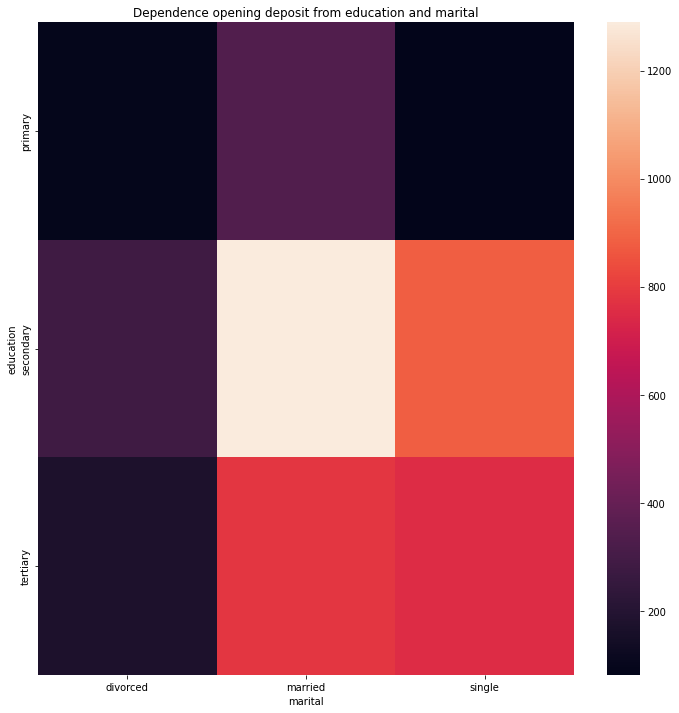

In [24]:
# постройте сводную таблицу, чтобы определить люди с каким образованием и семейным статусом наиболее многочисленны
#(если рассматривать тех, кто открыл депозит)
df_yes=df[df['deposit']=='yes']
fig_df=df_yes.pivot_table(index='education', columns='marital',aggfunc='count')
plt.figure(figsize=(12,12))
sns.heatmap(fig_df['age'])
plt.title('Dependence opening deposit from education and marital');

Больше всего женатых людей с уровнем образования `secondary`

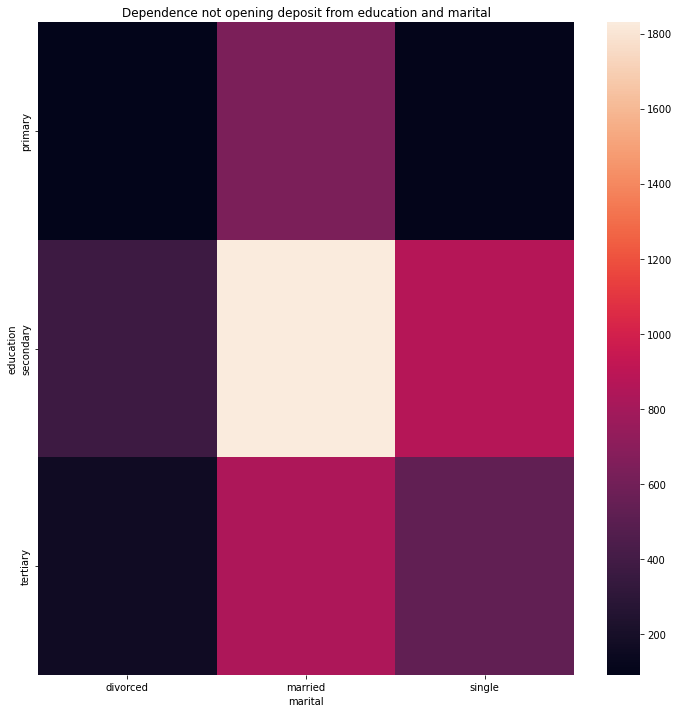

In [25]:
df_yes=df[df['deposit']=='no']
fig_df=df_yes.pivot_table(index='education', columns='marital',aggfunc='count')
plt.figure(figsize=(12,12))
sns.heatmap(fig_df['age'])
plt.title('Dependence not opening deposit from education and marital');

## Часть 3: преобразование данных

### Задание 1

In [26]:
df.drop('age', axis=1)
# преобразуйте уровни образования
LE=LabelEncoder()
df['education']=LE.fit_transform(df['education'])

### Задания 2 и 3

In [27]:
# преобразуйте бинарные переменные в представление из нулей и единиц
df['group_age']=LE.fit_transform(df['group_age'])
df['deposit']=df['deposit'].apply(lambda x: 1 if x=='yes' else 0)

In [28]:
df['default']=df['default'].apply(lambda x: 1 if x=='yes' else 0)
df['housing']=df['housing'].apply(lambda x: 1 if x=='yes' else 0)
df['loan']=df['loan'].apply(lambda x: 1 if x=='yes' else 0)

In [29]:
df['default'].mean()+df['housing'].mean()+df['loan'].mean()

0.6354280059376547

### Задание 4

In [30]:
# создайте дамми-переменные
df=pd.get_dummies(df)


In [31]:
df.shape

(10105, 46)

### Задания 5 и 6

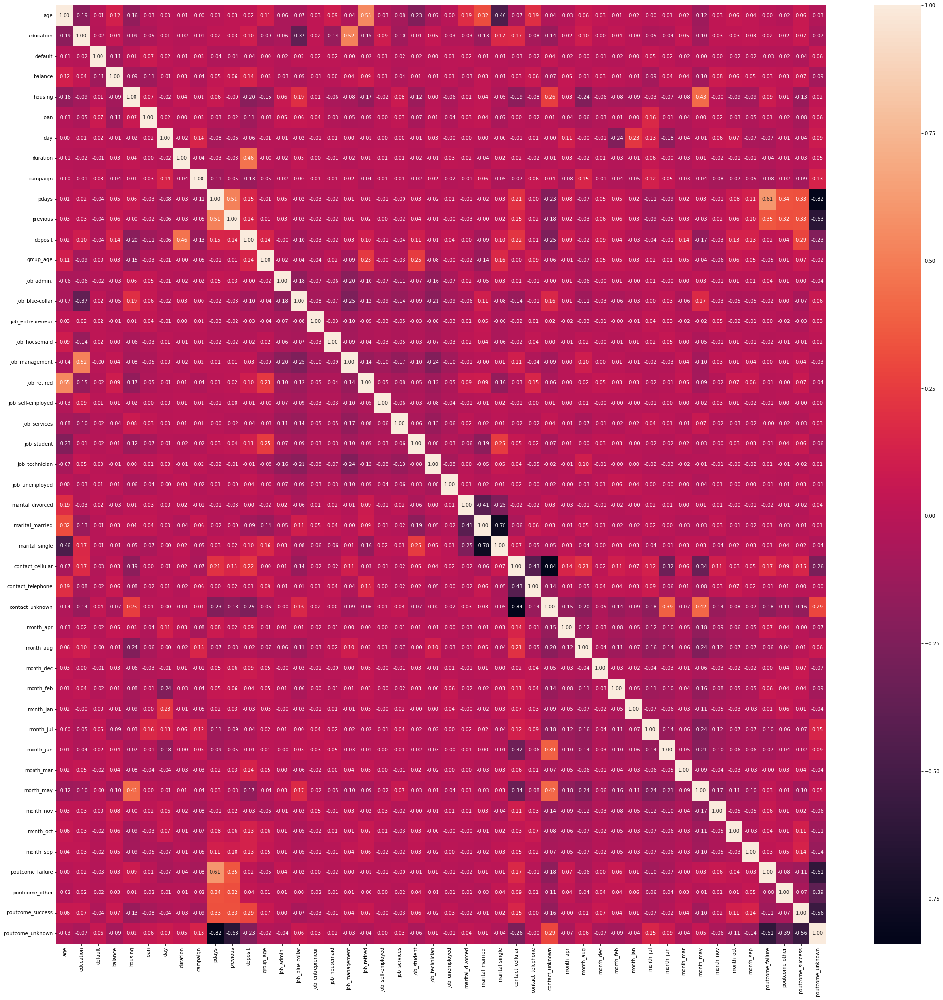

In [32]:
# постройте корреляционную матрицу и оцените данные на предмет наличия мультиколлинеарности
plt.figure(figsize=(35,35))
sns.heatmap(df.corr(), annot=True, fmt='.2f');

In [33]:
bar_df=df.corr()['deposit'].sort_values().drop('deposit')
fig = px.bar(data_frame=bar_df, title='correlation features and deposit', color=bar_df.index)
fig.update_layout(xaxis_title='feature', yaxis_title='coeff_corr')
fig.show()


### Задания 7 и 8

In [34]:
X = df.drop(['deposit'], axis=1)
y = df['deposit']
 
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state = 42, test_size = 0.33)

In [35]:
# рассчитайте необходимые показатели
print(X_test.shape)
print(y_test.mean())

(3335, 45)
0.46326836581709147


### Задание 9

In [36]:
SelectKBest(k=15, score_func=f_classif)


SelectKBest(k=15)

In [37]:
kbest=SelectKBest(k=15, score_func=f_classif)
X_train=kbest.fit_transform(X_train, y_train)
X_test=kbest.transform(X_test)

In [38]:
filter = kbest.get_support()
X.columns[filter]

Index(['balance', 'housing', 'duration', 'campaign', 'pdays', 'previous',
       'group_age', 'contact_cellular', 'contact_unknown', 'month_mar',
       'month_may', 'month_oct', 'month_sep', 'poutcome_success',
       'poutcome_unknown'],
      dtype='object')

### Задание 10

In [39]:
from sklearn.preprocessing import MinMaxScaler
mm=MinMaxScaler()
X_train_scaled=mm.fit_transform(X_train)
X_test_scaled=mm.transform(X_test)

In [40]:
X_test_scaled[:,0].mean()

0.46823674223097866

# Часть 4: Решение задачи классификации: логистическая регрессия и решающие деревья

### Задание 1

In [41]:
# обучите логистическую регрессию и рассчитайте метрики качества
log_reg=linear_model.LogisticRegression(solver='sag', random_state=42, max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
y_train_pred=log_reg.predict(X_train_scaled)
y_test_pred=log_reg.predict(X_test_scaled)
print(f'Значение accuracy на обучающей выборке: {metrics.accuracy_score(y_train, y_train_pred)}')
print(f'Значение accuracy на тестовой выборке: {metrics.accuracy_score(y_test, y_test_pred)}')

Значение accuracy на обучающей выборке: 0.8242245199409158
Значение accuracy на тестовой выборке: 0.8062968515742129


### Задания 2,3,4

In [42]:
# обучите решающие деревья, настройте максимальную глубину
dt=tree.DecisionTreeClassifier(criterion='entropy', random_state=42)
dt.fit(X_train_scaled, y_train)
y_train_pred=dt.predict(X_train_scaled)
y_test_pred=dt.predict(X_test_scaled)
print(f'Значение accuracy на обучающей выборке: {metrics.accuracy_score(y_train, y_train_pred)}')
print(f'Значение accuracy на тестовой выборке: {metrics.accuracy_score(y_test, y_test_pred)}')

Значение accuracy на обучающей выборке: 1.0
Значение accuracy на тестовой выборке: 0.7562218890554723


In [43]:
train_accuracy=[]
test_accuracy=[]
for max_depth in range(1, 10):
    dt=tree.DecisionTreeClassifier(max_depth=max_depth, criterion='entropy', random_state=42)
    dt.fit(X_train_scaled, y_train)
    y_train_pred=dt.predict(X_train_scaled)
    y_test_pred=dt.predict(X_test_scaled)
    train_accuracy.append(metrics.accuracy_score(y_train, y_train_pred))
    test_accuracy.append(metrics.accuracy_score(y_test, y_test_pred))
    

In [44]:
train_df=pd.DataFrame({'max_depth':range(1,10), 'accuracy':train_accuracy, 'legend:':'train'})
test_df=pd.DataFrame({'max_depth':range(1,10), 'accuracy':test_accuracy, 'legend:':'test'})
fig_df=pd.concat([train_df, test_df])
fig=px.line(fig_df, x='max_depth', y='accuracy', color='legend:', 
            color_discrete_sequence=['purple', 'rgb(93,105,177)'], title='dependence train accuracy and test accuracy from max_depth')
fig.show()

In [45]:
diff_accuracy=[x1-x2 for (x1,x2) in zip(train_accuracy, test_accuracy)]
fig_df=pd.DataFrame({'max_depth':range(1,10), 'diff_accuracy':diff_accuracy})
fig=px.line(fig_df, x='max_depth', y='diff_accuracy', color_discrete_sequence=['purple'],
            title='dependence difference between train accuracy and test accuracy from max_depth')
fig.show()

После глубины максимальной глубины дерева, равной 6, разность между метрикой на обучающей и тестовой метриках начинает сильне различаться, что намекает на переобучение.

### Задание 5

In [46]:
# подберите оптимальные параметры с помощью gridsearch
from sklearn.model_selection import GridSearchCV
params = {'min_samples_split': [2, 5, 7, 10], 'max_depth': [3, 5, 7]}
dt=tree.DecisionTreeClassifier(random_state=42)
search=GridSearchCV(estimator=dt, scoring='f1', cv=5, n_jobs=-1, param_grid=params)
search.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7],
                         'min_samples_split': [2, 5, 7, 10]},
             scoring='f1')

In [55]:
search.best_params_

{'max_depth': 7, 'min_samples_split': 2}

In [47]:
dt=tree.DecisionTreeClassifier(**search.best_params_, random_state=42)
dt.fit(X_train_scaled, y_train)
y_test_pred=dt.predict(X_test_scaled)
print(metrics.f1_score(y_test, y_test_pred))

0.801023672424824


# Часть 5: Решение задачи классификации: ансамбли моделей и построение прогноза

### Задание 1

In [48]:
# обучите на ваших данных случайный лес
rf=ensemble.RandomForestClassifier(n_estimators=100, criterion='gini', min_samples_leaf=5, max_depth=10, random_state=42)
rf.fit(X_train_scaled, y_train)
y_test_pred=rf.predict(X_test_scaled)
print(metrics.f1_score(y_test, y_test_pred))
print(metrics.recall_score(y_test, y_test_pred))
print(metrics.precision_score(y_test, y_test_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.8164174355711104
0.83042071197411
0.8028785982478097
0.8269865067466267


### Задания 2 и 3

In [58]:
# используйте для классификации градиентный бустинг и сравните качество со случайным лесом
gboost = ensemble.GradientBoostingClassifier(learning_rate=0.05,
                                             n_estimators=300,
                                             min_samples_leaf=5,
                                             max_depth=5,
                                             random_state=42)
gboost.fit(X_train_scaled, y_train)
y_test_pred=gboost.predict(X_test_scaled)
print(metrics.f1_score(y_test, y_test_pred))
print(metrics.recall_score(y_test, y_test_pred))
print(metrics.precision_score(y_test, y_test_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.8166507785192245
0.8317152103559871
0.8021223470661673
0.8269865067466267


### Задание 4

In [56]:
# объедините уже известные вам алгоритмы с помощью стекинга
dt=tree.DecisionTreeClassifier(**search.best_params_, random_state=42)
gboost_st = ensemble.GradientBoostingClassifier(learning_rate=0.05,
                                             n_estimators=300,
                                             min_samples_leaf=5,
                                             max_depth=5,
                                             random_state=42)
log_reg=linear_model.LogisticRegression(solver='sag', random_state=42, max_iter=1000)
estimators = [('dt',dt), ('gboost',gboost_st), ('log_reg', log_reg)]
stack_cl=ensemble.StackingClassifier(estimators=estimators,
                            final_estimator=log_reg, cv=5)
stack_cl.fit(X_train_scaled, y_train)
y_test_pred=stack_cl.predict(X_test_scaled)
print(metrics.precision_score(y_test, y_test_pred))

0.8062860808210391


### Задание 5

In [67]:
# оцените, какие признаки демонстрируют наибольшую  важность в модели градиентного бустинга
fig=px.bar(x=gboost.feature_importances_, y=kbest.get_feature_names_out(),
           color=kbest.get_feature_names_out(), color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(xaxis_title='importance', yaxis_title='features', title='features importance')
fig.show()

### Задания 6,7,8

In [74]:
# реализуйте оптимизацию гиперпараметров с помощью Optuna
def opt_rf(trial, cv=5):
    params={
    'n_estimators':trial.suggest_int('n_estimators', 100, 200, 1),
    'max_depth':trial.suggest_int('max_depth', 10, 30, 1),
    'min_samples_leaf':trial.suggest_int('min_samples_leaf', 2, 10, 1)
    }
    
    rf=ensemble.RandomForestClassifier(**params, random_state=42)
    score=cross_val_score(estimator=rf, X=X_train_scaled, y=y_train, scoring='f1', n_jobs=-1, cv=cv).mean()
    return score

In [76]:
%%time
# cоздаем объект исследования
# можем напрямую указать, что нам необходимо максимизировать метрику direction="maximize"
study = optuna.create_study(study_name="RandomForestClassifier", direction="maximize")
# ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(opt_rf, n_trials=50)

[I 2023-05-30 21:14:05,498] A new study created in memory with name: RandomForestClassifier
[I 2023-05-30 21:14:06,878] Trial 0 finished with value: 0.8253646842726414 and parameters: {'n_estimators': 124, 'max_depth': 14, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.8253646842726414.
[I 2023-05-30 21:14:08,223] Trial 1 finished with value: 0.8251756537319908 and parameters: {'n_estimators': 152, 'max_depth': 23, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.8253646842726414.
[I 2023-05-30 21:14:09,323] Trial 2 finished with value: 0.8219691146743543 and parameters: {'n_estimators': 126, 'max_depth': 16, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.8253646842726414.
[I 2023-05-30 21:14:10,438] Trial 3 finished with value: 0.8221612708119632 and parameters: {'n_estimators': 132, 'max_depth': 21, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.8253646842726414.
[I 2023-05-30 21:14:11,354] Trial 4 finished with value: 0.822941506907194 and parameters: {'n_e

CPU times: total: 1.98 s
Wall time: 1min 17s


In [80]:
print(study.best_params)
rf=ensemble.RandomForestClassifier(**study.best_params, random_state=42)
rf.fit(X_train_scaled, y_train)
y_test_pred=rf.predict(X_test_scaled)
print(metrics.f1_score(y_test, y_test_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

{'n_estimators': 169, 'max_depth': 22, 'min_samples_leaf': 3}
0.8206744405924993
0.8293853073463269
